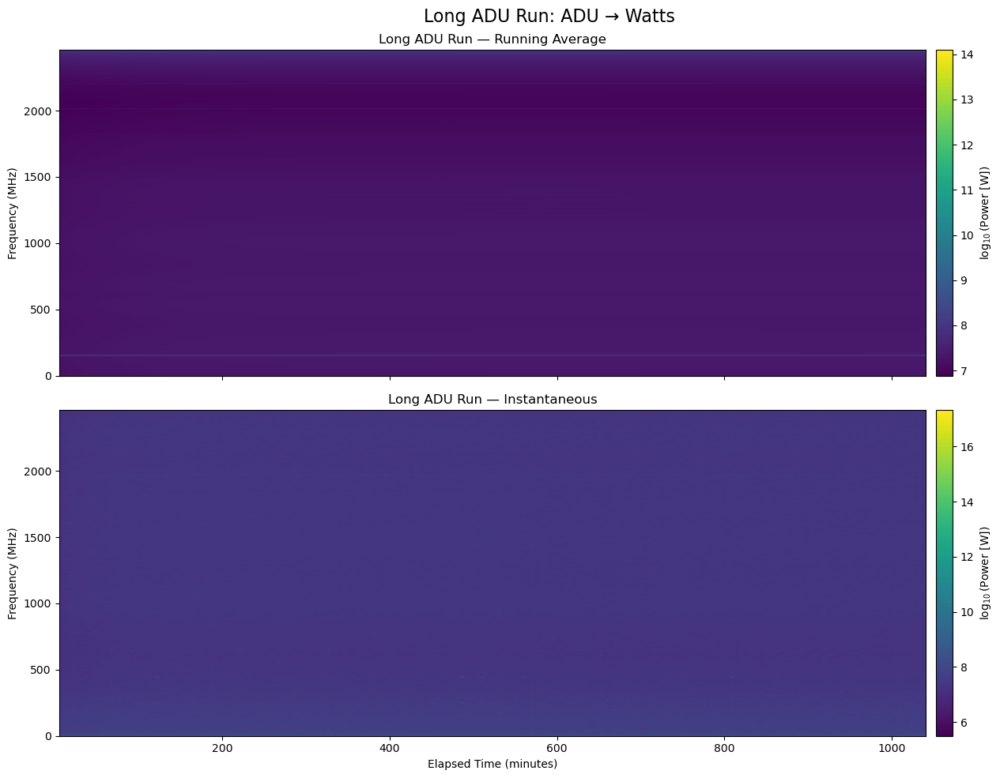

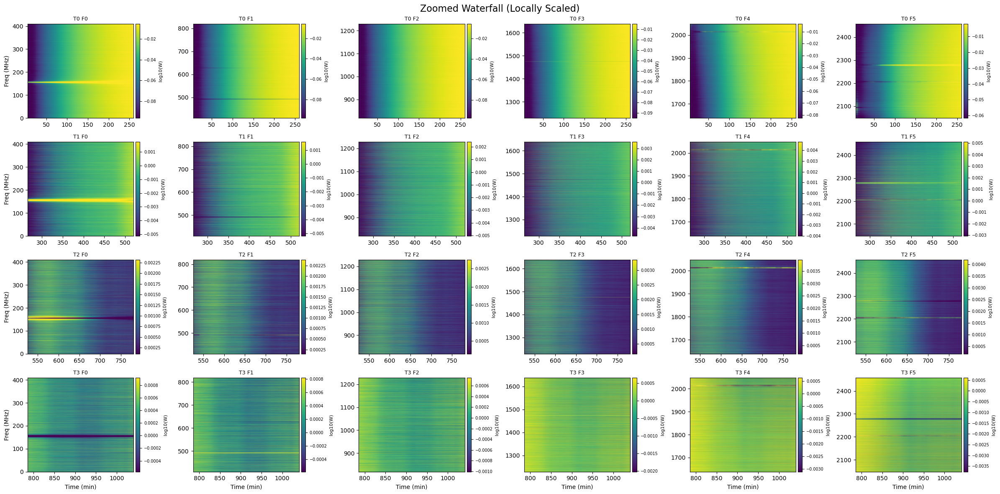

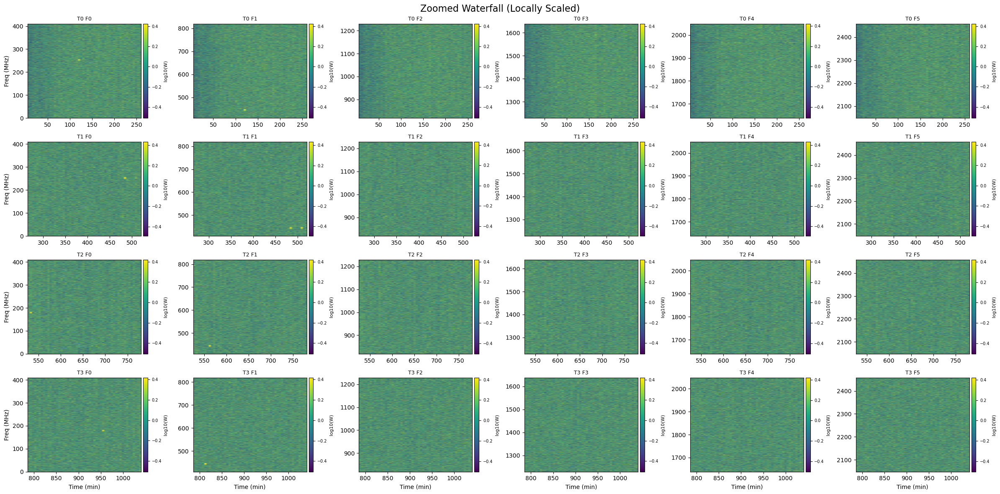

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import glob

# ================= USER HARDWARE SETTINGS =================
NBITS = 12          # ADC resolution (e.g. 12, 14, 16)
VFS   = 1.0         # Full-scale voltage at ADC input (Volts, peak)
RIN   = 50.0        # System impedance (Ohms)
EPS   = 1e-30       # Log safety floor
# ==========================================================


# ---------- ADU -> Watts conversion ----------
def adu_to_watts(spec_adu, nbits=NBITS, vfs=VFS, R=RIN):
    scale = vfs / (2**(nbits - 1))   # ADU -> Volts
    volts = spec_adu * scale
    return (volts**2) / R            # V^2 / R -> Watts


# ---------- Load continuous dataset ----------
def load_continuous_adu(base_dir):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError(f"No npz files found in {base_dir}")

    records = []
    for f in files:
        d = np.load(f)
        records.append((float(d["elapsed"]), f))

    records.sort(key=lambda x: x[0])

    elapsed_spectra = []
    inst_spectra = []
    times = []
    F = None

    for elapsed, f in records:
        d = np.load(f)

        if F is None:
            F = d["F"]

        nchan = F.size

        inst = d["inst_raw"].reshape(-1, nchan)
        avg  = d["avg_raw"].reshape(-1, nchan)

        # instantaneous snapshot
        inst_phys = adu_to_watts(inst[0])

        # accumulated spectrum at file time
        avg_phys  = adu_to_watts(avg[-1])

        inst_spectra.append(inst_phys)
        elapsed_spectra.append(avg_phys)
        times.append(elapsed)

    return F, np.array(times), np.array(elapsed_spectra), np.array(inst_spectra)


# ---------- Global waterfall (for overview) ----------
def plot_waterfall(ax, F, times, spectra, title):
    log_spec = np.log10(spectra + EPS).T

    im = ax.imshow(
        log_spec,
        aspect="auto",
        origin="lower",
        extent=[times[0]/60, times[-1]/60, F[0], F[-1]],
        cmap="viridis"
    )

    ax.set_ylabel("Frequency (MHz)")
    ax.set_title(title)

    cbar = plt.colorbar(im, ax=ax, pad=0.01)
    cbar.set_label(r"$\log_{10}(\mathrm{Power\ [W]})$")


def plot_continuous_dataset(base_dir, label):
    F, times, elapsed_spec, inst_spec = load_continuous_adu(base_dir)

    fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

    plot_waterfall(axes[0], F, times, elapsed_spec, f"{label} — Running Average")
    plot_waterfall(axes[1], F, times, inst_spec,  f"{label} — Instantaneous")

    axes[1].set_xlabel("Elapsed Time (minutes)")
    fig.suptitle(f"{label}: ADU → Watts", fontsize=16)

    plt.tight_layout()
    plt.show()

    return F, times, elapsed_spec, inst_spec


# ---------- Robust local scaling ----------
def robust_limits(data, lo=5, hi=95):
    vmin = np.percentile(data, lo)
    vmax = np.percentile(data, hi)
    if vmin == vmax:
        vmax = vmin + 1e-12
    return vmin, vmax


# ---------- Optional bandpass removal (for visibility) ----------
def remove_bandpass(spec2d):
    band = np.median(spec2d, axis=0)
    band[band == 0] = 1
    return spec2d / band


# ---------- Zoom grid with dynamic scaling ----------
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_zoom_grid(F, times, spectra, nfreq=5, ntime=4, detrend=True):
    if detrend:
        spectra = remove_bandpass(spectra)

    log_spec = np.log10(spectra + EPS)

    nf = len(F)
    nt = len(times)

    f_edges = np.linspace(0, nf, nfreq + 1, dtype=int)
    t_edges = np.linspace(0, nt, ntime + 1, dtype=int)

    fig, axes = plt.subplots(
        ntime, nfreq,
        figsize=(4*nfreq, 3*ntime),
        squeeze=False
    )

    for i in range(ntime):
        for j in range(nfreq):
            ax = axes[i, j]

            t0, t1 = t_edges[i], t_edges[i+1]
            f0, f1 = f_edges[j], f_edges[j+1]

            tile = log_spec[t0:t1, f0:f1].T

            vmin, vmax = robust_limits(tile)

            im = ax.imshow(
                tile,
                aspect="auto",
                origin="lower",
                extent=[
                    times[t0]/60, times[t1-1]/60,
                    F[f0], F[f1-1]
                ],
                vmin=vmin,
                vmax=vmax,
                cmap="viridis"
            )

            # ---- attach a colorbar to THIS subplot ----
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="4%", pad=0.05)
            cbar = plt.colorbar(im, cax=cax)
            cbar.ax.tick_params(labelsize=7)
            cbar.set_label("log10(W)", fontsize=8)

            ax.set_title(f"T{i} F{j}", fontsize=9)

            if i == ntime - 1:
                ax.set_xlabel("Time (min)")
            if j == 0:
                ax.set_ylabel("Freq (MHz)")

    fig.suptitle("Zoomed Waterfall (Locally Scaled)", fontsize=16)
    plt.tight_layout()
    plt.show()


# ===================== RUN =====================

BASE_DIR = "./"   # directory containing the .npz files

F, times, elapsed_spec, inst_spec = plot_continuous_dataset(BASE_DIR, "Long ADU Run")

# High-contrast zoom views
plot_zoom_grid(F, times, elapsed_spec, nfreq=6, ntime=4, detrend=True)
plot_zoom_grid(F, times, inst_spec,   nfreq=6, ntime=4, detrend=True)


Loaded 208 spectra


/var/folders/y2/qh0xmfp57pg1gkfyt952g7ww0000gp/T/ipykernel_19059/2530229014.py:126: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


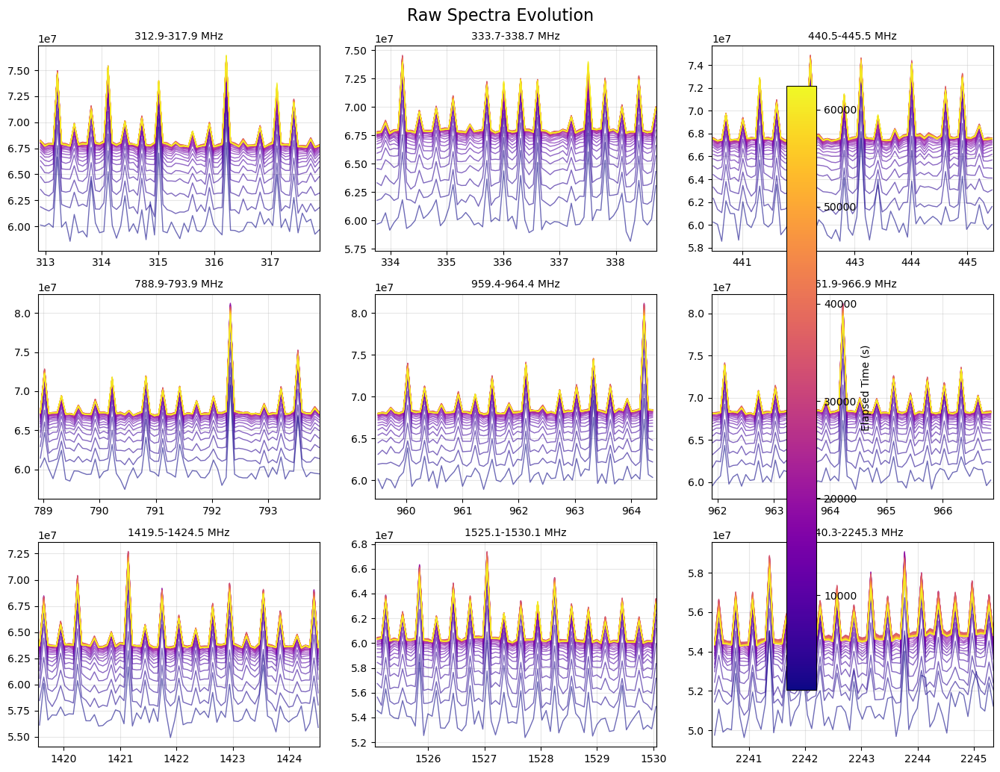

/var/folders/y2/qh0xmfp57pg1gkfyt952g7ww0000gp/T/ipykernel_19059/2530229014.py:172: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


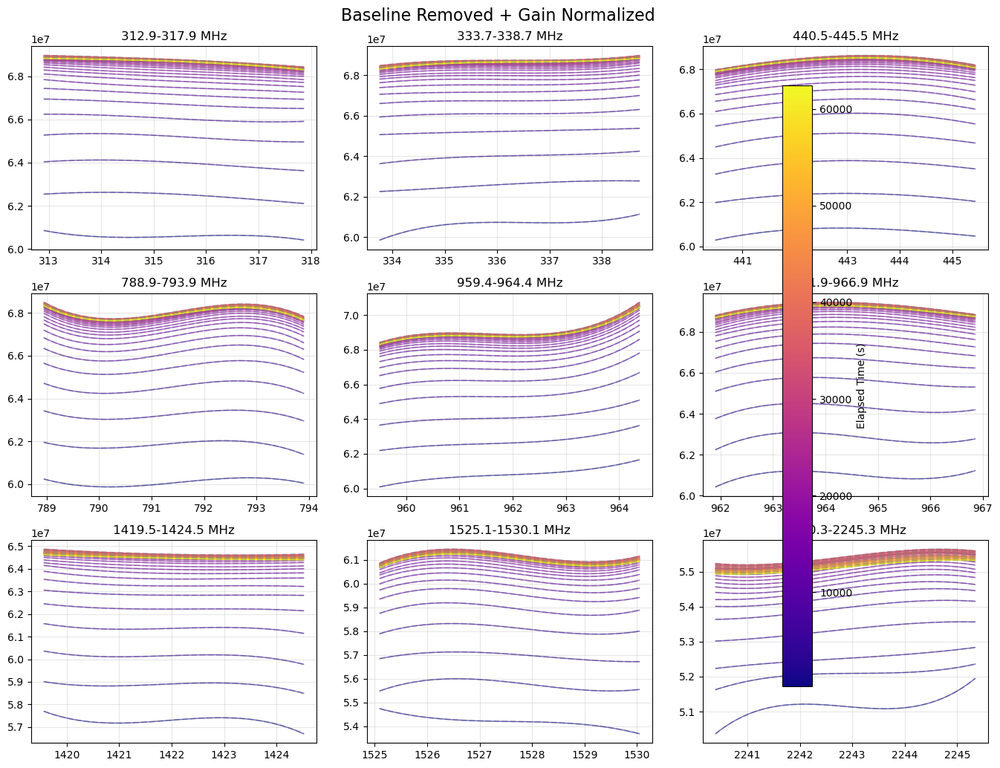

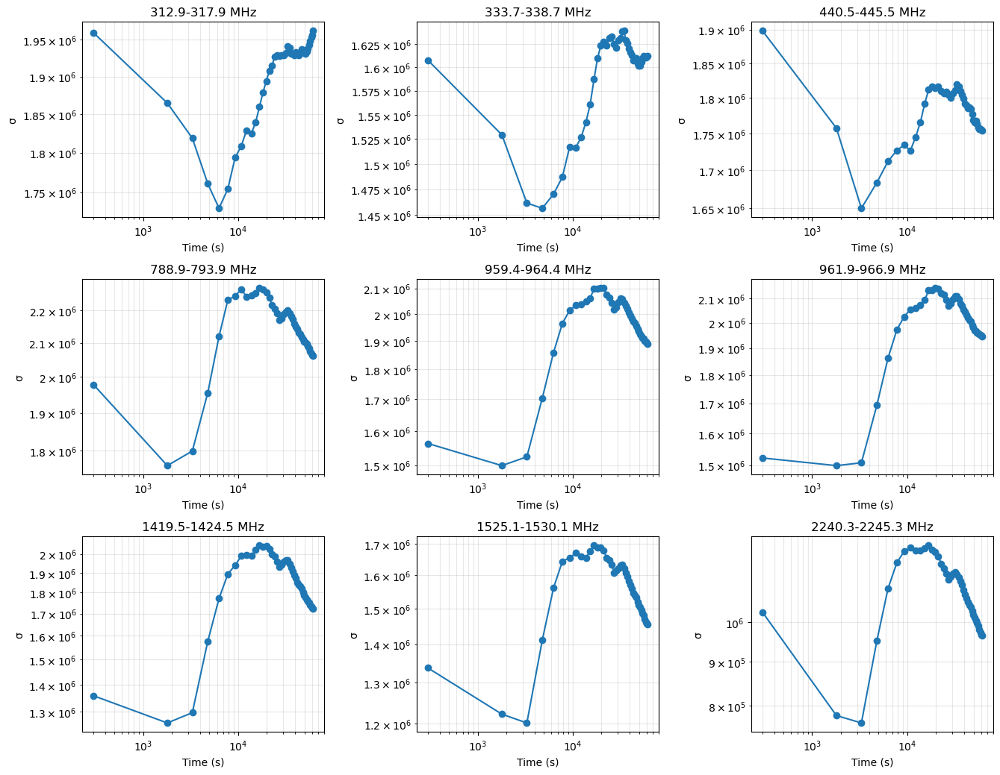

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
import random
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# ================================
# USER SETTINGS
# ================================
DATA_DIR = "./"        # directory with current npz files
USE_WATTS = False      # True = calibrate, False = stay in ADU

NBITS = 12
VFS   = 1.0
RIN   = 50.0

MHz_window = 5.0
n_windows  = 9
max_lines  = 40
poly_order = 3
target_var = 0.10
# ================================


# ---------- ADU → Watts (optional) ----------
def adu_to_watts(x):
    scale = VFS / (2**(NBITS-1))
    v = x * scale
    return (v**2)/RIN


# ---------- LOAD CURRENT DATA FORMAT ----------
records = []

files = glob.glob(f"{DATA_DIR}/*.npz")
if not files:
    raise RuntimeError("No files found.")

for f in files:
    d = np.load(f)
    records.append((float(d["elapsed"]), f))

records.sort(key=lambda x: x[0])

spectra_by_time = {}
all_times = []

for t, f in records:
    d = np.load(f)

    F = d["F"]
    nchan = F.size

    avg = d["avg_raw"].reshape(-1, nchan)[-1]

    if USE_WATTS:
        avg = adu_to_watts(avg)

    spectra_by_time[t] = avg
    all_times.append(t)

all_times = sorted(all_times)

print(f"Loaded {len(all_times)} spectra")


# ================================
# RANDOM FREQUENCY WINDOWS
# ================================
f_min = F.min()
f_max = F.max() - MHz_window

random_starts = sorted(random.sample(list(np.linspace(f_min, f_max, 2000)), n_windows))

ncols = int(np.ceil(np.sqrt(n_windows)))
nrows = int(np.ceil(n_windows / ncols))

norm = Normalize(vmin=min(all_times), vmax=max(all_times))
cmap = plt.cm.plasma

if len(all_times) > max_lines:
    step = len(all_times)//max_lines
    plot_times = all_times[::step]
else:
    plot_times = all_times


# ================================
# 1) RAW SPECTRA IN RANDOM WINDOWS
# ================================
fig, axes = plt.subplots(nrows, ncols, figsize=(4.5*ncols,3.5*nrows))
axes = axes.flatten()

for ax, f0 in zip(axes, random_starts):
    f1 = f0 + MHz_window
    yvals = []

    for t in plot_times:
        spec = spectra_by_time[t]
        mask = (F>=f0)&(F<=f1)

        ax.plot(F[mask], spec[mask],
                color=cmap(norm(t)),
                alpha=0.6, lw=1)

        yvals.extend(spec[mask])

    if yvals:
        ymin,ymax=min(yvals),max(yvals)
        ax.set_ylim(ymin-0.05*(ymax-ymin), ymax+0.05*(ymax-ymin))

    ax.set_xlim(f0,f1)
    ax.set_title(f"{f0:.1f}-{f1:.1f} MHz",fontsize=10)
    ax.grid(alpha=0.3)

for ax in axes[len(random_starts):]:
    ax.axis('off')

fig.suptitle("Raw Spectra Evolution",fontsize=16)

sm = ScalarMappable(norm=norm,cmap=cmap)
fig.colorbar(sm,ax=axes.tolist(),label="Elapsed Time (s)")

plt.tight_layout()
plt.show()


# ================================
# 2) BASELINE SUBTRACTION + GAIN NORMALIZATION
# ================================
baseline_sub = {}

for t in plot_times:
    spec = spectra_by_time[t]
    residuals = []

    for f0 in random_starts:
        f1 = f0 + MHz_window
        mask = (F>=f0)&(F<=f1)

        s = spec[mask]
        x = np.arange(len(s))

        p = np.polyfit(x,s,poly_order)
        base = np.polyval(p,x)

        r = s-base
        v = np.var(r)
        scale = np.sqrt(target_var/v) if v>0 else 1

        residuals.append((F[mask], base, base+r*scale))

    baseline_sub[t]=residuals


fig, axes = plt.subplots(nrows,ncols,figsize=(4.5*ncols,3.5*nrows))
axes=axes.flatten()

for ax,i in zip(axes,range(len(random_starts))):
    for t in plot_times:
        Fsl,base,scaled = baseline_sub[t][i]
        ax.plot(Fsl,base,'--',color='grey',alpha=0.4)
        ax.plot(Fsl,scaled,color=cmap(norm(t)),alpha=0.6,lw=1)

    ax.set_title(f"{random_starts[i]:.1f}-{random_starts[i]+MHz_window:.1f} MHz")
    ax.grid(alpha=0.3)

fig.suptitle("Baseline Removed + Gain Normalized",fontsize=16)
fig.colorbar(sm,ax=axes.tolist(),label="Elapsed Time (s)")
plt.tight_layout()
plt.show()


# ================================
# 3) RADIOMETER TEST (σ vs time)
# ================================
window_sd={f0:[] for f0 in random_starts}

for t in plot_times:
    spec=spectra_by_time[t]

    for f0 in random_starts:
        f1=f0+MHz_window
        mask=(F>=f0)&(F<=f1)

        s=spec[mask]
        x=np.arange(len(s))
        base=np.polyval(np.polyfit(x,s,poly_order),x)
        window_sd[f0].append(np.std(s-base))


fig,axes=plt.subplots(nrows,ncols,figsize=(4.5*ncols,3.5*nrows))
axes=axes.flatten()

for ax,f0 in zip(axes,random_starts):
    ax.plot(plot_times,window_sd[f0],'o-')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_title(f"{f0:.1f}-{f0+MHz_window:.1f} MHz")
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("σ")
    ax.grid(which='both',alpha=0.3)

plt.tight_layout()
plt.show()


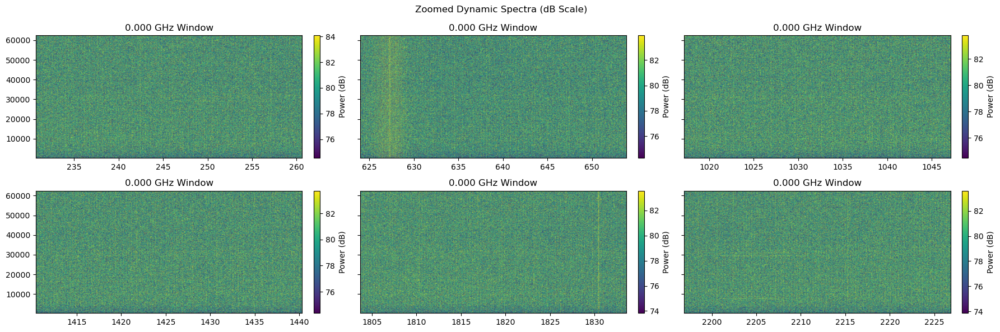

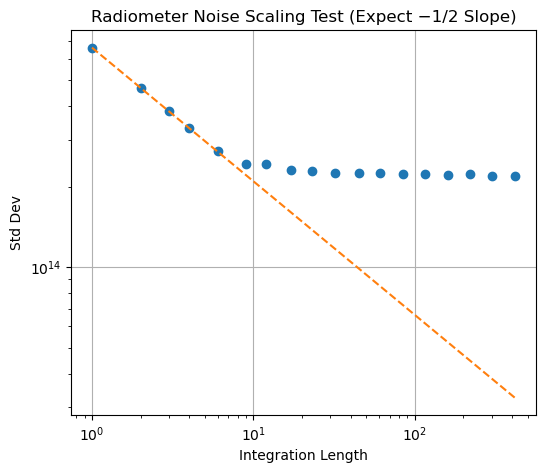

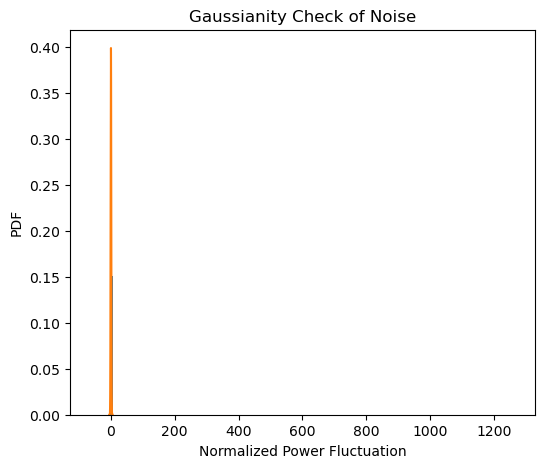

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.stats import norm

# ============================
# USER PARAMETERS
# ============================

DATA_DIR = "./"              # directory with .npz files
ADC_FULL_SCALE_V = 1.0       # ADC full-scale voltage (adjust if known)
ADC_BITS = 10                # your system ~2^10
R_OHMS = 50.0                # system impedance
N_ZOOMS = 6                  # number of zoom panels
ZOOM_WIDTH = 400             # channels per zoom window

# ============================
# ADU → Volts conversion
# ============================

ADU_TO_VOLTS = ADC_FULL_SCALE_V / (2**ADC_BITS)
VOLTS2_TO_WATTS = 1.0 / R_OHMS


def load_dataset(base_dir):
    files = sorted(Path(base_dir).glob("*.npz"))

    spectra = []
    times = []

    for f in files:
        d = np.load(f)

        F = d["F"]
        inst = d["inst_raw"]          # ADU units
        elapsed = float(d["elapsed"])

        nchan = F.size
        nstack = inst.size // nchan
        inst = inst.reshape(nstack, nchan)

        spectra.append(inst)
        times.extend([elapsed] * nstack)

    spectra = np.vstack(spectra)
    times = np.array(times)

    return F, times, spectra


def adu_to_watts(x_adu):
    volts = x_adu * ADU_TO_VOLTS
    v2 = volts**2
    watts = v2 * VOLTS2_TO_WATTS
    return watts


def to_dB(x):
    x = np.clip(x, 1e-30, None)
    return 10 * np.log10(x)


def robust_limits(data):
    vmin = np.percentile(data, 5)
    vmax = np.percentile(data, 95)
    return vmin, vmax


# ============================
# Radiometer Slope Test
# ============================

def radiometer_test(power_linear):
    """
    Tests sigma ~ t^{-1/2}
    """

    n = power_linear.shape[0]
    block_sizes = np.unique(np.logspace(0, np.log10(n//4), 20).astype(int))

    sigmas = []
    for b in block_sizes:
        trimmed = power_linear[: (n // b) * b]
        avg = trimmed.reshape(-1, b, power_linear.shape[1]).mean(axis=1)
        sigmas.append(np.std(avg))

    sigmas = np.array(sigmas)

    plt.figure(figsize=(6,5))
    plt.loglog(block_sizes, sigmas, 'o')

    # reference -1/2 slope
    ref = sigmas[0] * (block_sizes / block_sizes[0])**(-0.5)
    plt.loglog(block_sizes, ref, '--')

    plt.xlabel("Integration Length")
    plt.ylabel("Std Dev")
    plt.title("Radiometer Noise Scaling Test (Expect −1/2 Slope)")
    plt.grid(True)
    plt.show()


# ============================
# Gaussianity Check
# ============================

def gaussian_test(power_linear):
    """
    Histogram of normalized fluctuations → should be Gaussian
    """

    fluctuations = power_linear - np.mean(power_linear, axis=0)
    fluctuations /= np.std(fluctuations)

    flat = fluctuations.ravel()

    mu, sigma = norm.fit(flat)

    plt.figure(figsize=(6,5))
    plt.hist(flat, bins=200, density=True)

    x = np.linspace(-5,5,500)
    plt.plot(x, norm.pdf(x, mu, sigma))

    plt.title("Gaussianity Check of Noise")
    plt.xlabel("Normalized Power Fluctuation")
    plt.ylabel("PDF")
    plt.show()


# ============================
# Multi-Zoom Waterfall
# ============================

def plot_zoom_grid(F, times, power_dB):
    ntime, nchan = power_dB.shape

    centers = np.linspace(nchan*0.1, nchan*0.9, N_ZOOMS).astype(int)

    fig, axes = plt.subplots(2, N_ZOOMS//2, figsize=(18,6), sharey=True)
    axes = axes.ravel()

    for ax, c in zip(axes, centers):
        lo = max(0, c - ZOOM_WIDTH//2)
        hi = min(nchan, c + ZOOM_WIDTH//2)

        sub = power_dB[:, lo:hi]
        vmin, vmax = robust_limits(sub)

        im = ax.imshow(
            sub,
            aspect='auto',
            origin='lower',
            extent=[F[lo], F[hi-1], times[0], times[-1]],
            vmin=vmin,
            vmax=vmax
        )

        ax.set_title(f"{F[c]/1e9:.3f} GHz Window")

        # colorbar OUTSIDE
        cbar = fig.colorbar(im, ax=ax, location="right", fraction=0.046, pad=0.04)
        cbar.set_label("Power (dB)")

    fig.suptitle("Zoomed Dynamic Spectra (dB Scale)")
    plt.tight_layout()
    plt.show()


# ============================
# Main
# ============================

F, times, spectra_adu = load_dataset(DATA_DIR)

power_watts = adu_to_watts(spectra_adu)
power_dB = to_dB(power_watts)

plot_zoom_grid(F, times, power_dB)

radiometer_test(power_watts)

gaussian_test(power_watts)


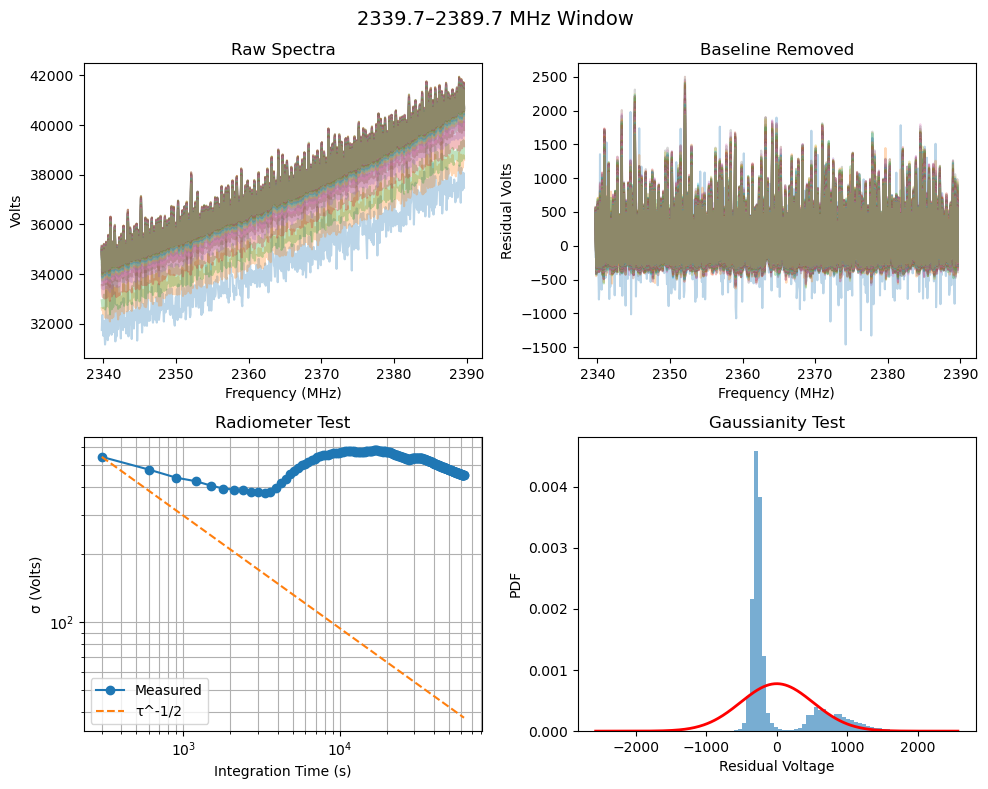

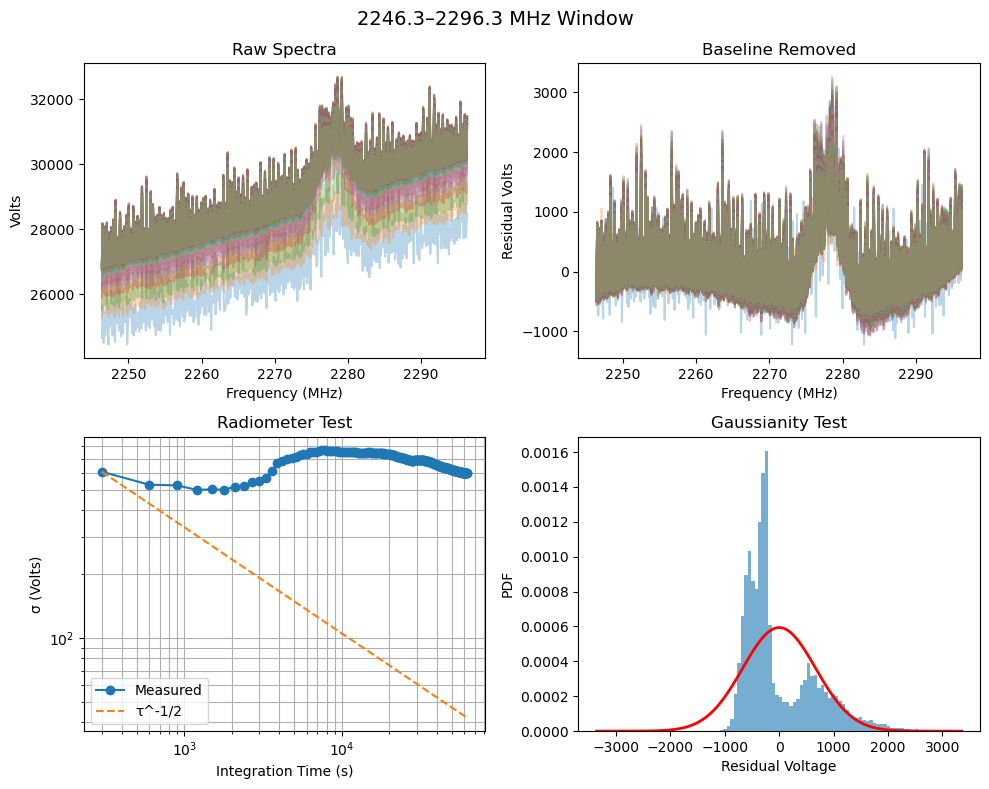

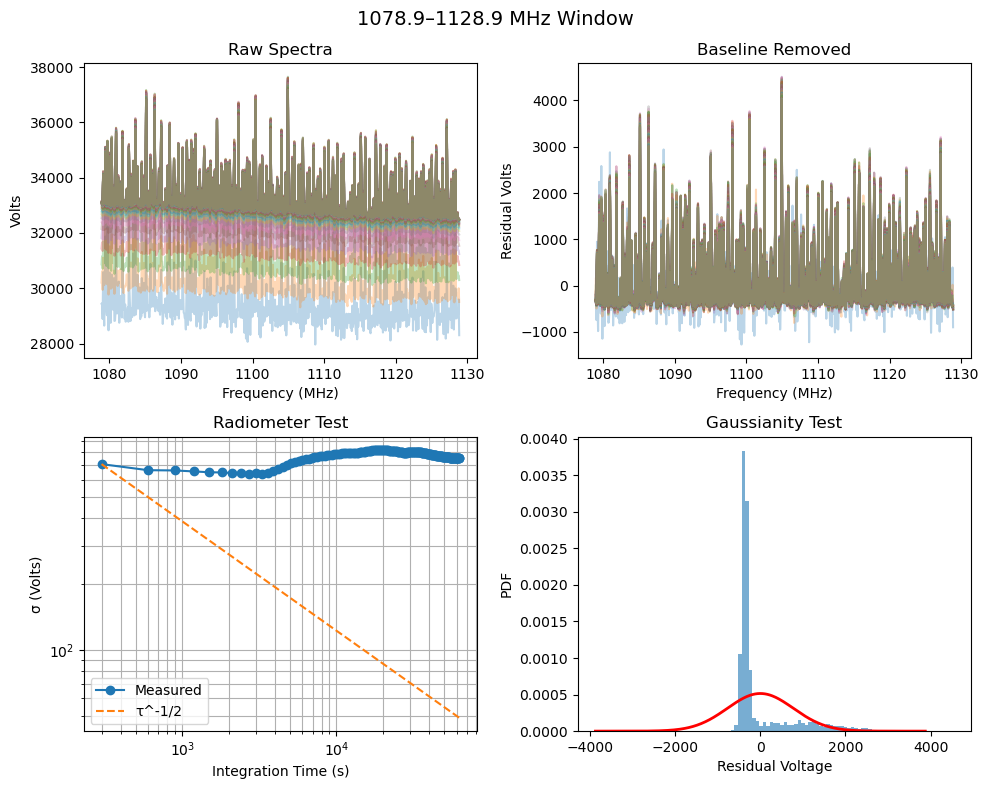

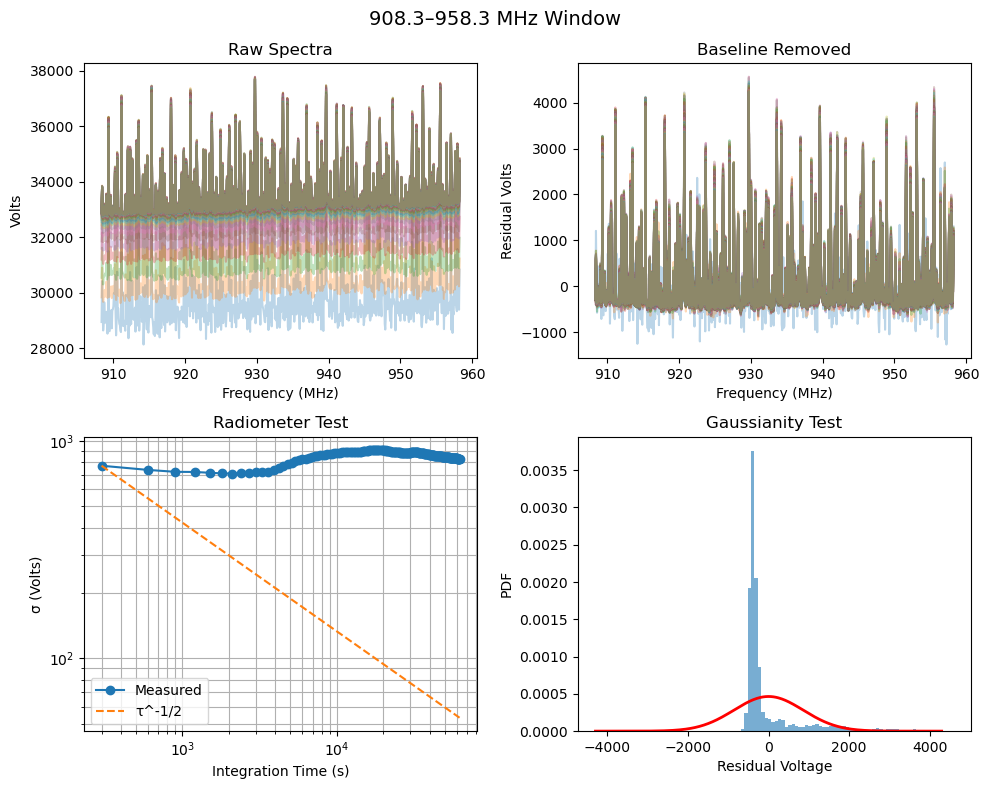

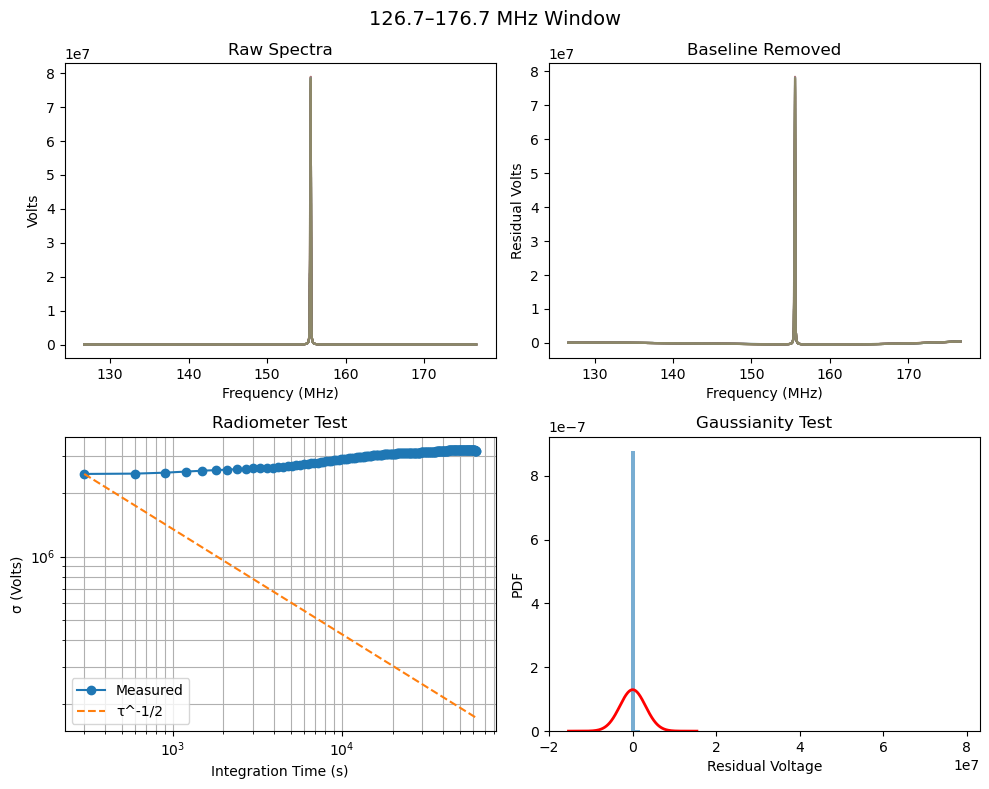

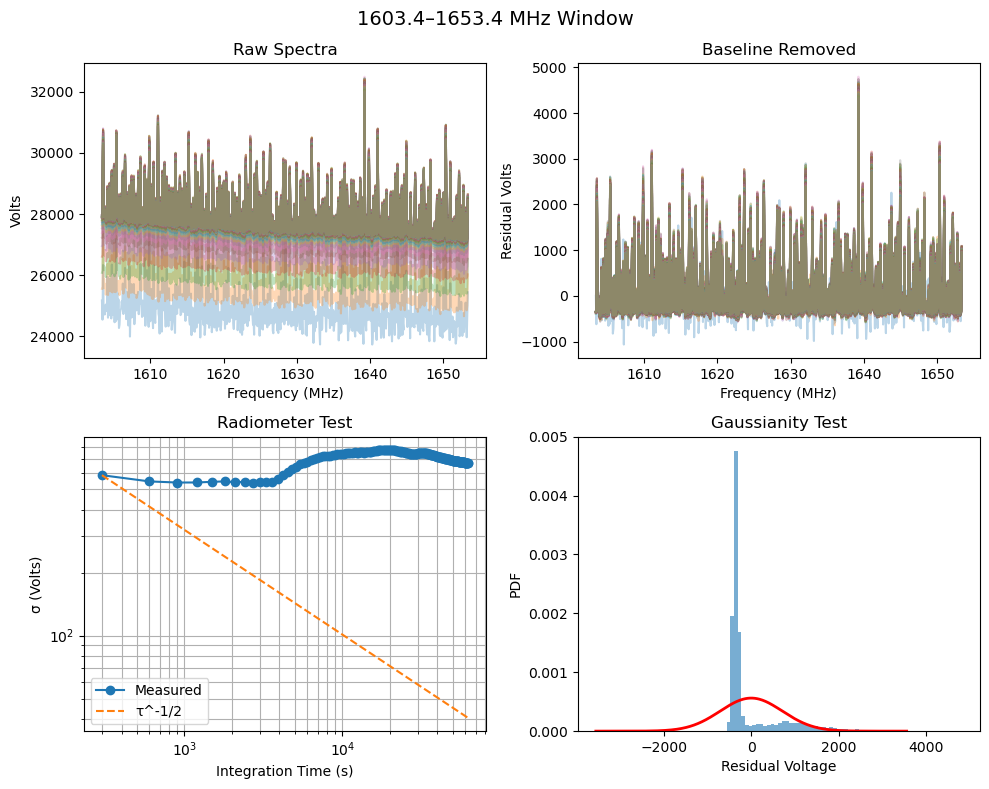

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import glob
import random
from scipy.stats import norm

# ================= USER SETTINGS =================
NBITS = 12          # ADC resolution
VFS   = 1.0         # Full-scale voltage (Volts, peak)
WINDOW_MHZ = 50.0   # Width of random analysis window
N_WINDOWS = 6        # How many random slices to analyze
POLY_ORDER = 3       # Bandpass removal polynomial
MAX_LINES = 40       # Max spectra to draw (for readability)
# =================================================


# ---------- ADU -> VOLTS ----------
def adu_to_volts(spec_adu):
    scale = VFS / (2**(NBITS - 1))
    return spec_adu * scale


# ---------- LOAD DATASET ----------
def load_dataset(base_dir="."):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    # sort by elapsed time
    rec = []
    for f in files:
        d = np.load(f)
        rec.append((float(d["elapsed"]), f))
    rec.sort(key=lambda x: x[0])

    spectra = []
    times = []
    F = None

    for t, f in rec:
        d = np.load(f)

        if F is None:
            F = d["F"]

        nchan = F.size
        avg = d["avg_raw"].reshape(-1, nchan)

        # running average spectrum at this file
        volts = adu_to_volts(avg[-1])

        spectra.append(volts)
        times.append(t)

    return F, np.array(times), np.array(spectra)


# ---------- PICK RANDOM 50 MHz WINDOWS ----------
def pick_windows(F, width, nwin):
    fmin = F.min()
    fmax = F.max() - width
    starts = np.random.uniform(fmin, fmax, nwin)
    return [(s, s + width) for s in starts]


# ---------- EXTRACT WINDOW ----------
def extract_window(F, spectra, f0, f1):
    mask = (F >= f0) & (F <= f1)
    return F[mask], spectra[:, mask]


# ---------- REMOVE BANDPASS ----------
def remove_bandpass(spec2d, order=3):
    cleaned = np.zeros_like(spec2d)
    x = np.arange(spec2d.shape[1])

    for i, row in enumerate(spec2d):
        p = np.polyfit(x, row, order)
        baseline = np.polyval(p, x)
        cleaned[i] = row - baseline

    return cleaned


# ---------- RAW EVOLUTION ----------
def plot_raw(ax, Fw, Sw, times):
    step = max(1, len(times)//MAX_LINES)
    for i in range(0, len(times), step):
        ax.plot(Fw, Sw[i], alpha=0.3)
    ax.set_title("Raw Spectra")
    ax.set_xlabel("Frequency (MHz)")
    ax.set_ylabel("Volts")


# ---------- NORMALIZED ----------
def plot_normalized(ax, Fw, residuals, times):
    step = max(1, len(times)//MAX_LINES)
    for i in range(0, len(times), step):
        ax.plot(Fw, residuals[i], alpha=0.3)
    ax.set_title("Baseline Removed")
    ax.set_xlabel("Frequency (MHz)")
    ax.set_ylabel("Residual Volts")


# ---------- RADIOMETER TEST ----------
def plot_radiometer(ax, times, residuals):
    sigma = np.std(residuals, axis=1)

    ax.loglog(times, sigma, 'o-', label="Measured")

    ref = sigma[0]*(times/times[0])**(-0.5)
    ax.loglog(times, ref, '--', label="τ^-1/2")

    ax.set_title("Radiometer Test")
    ax.set_xlabel("Integration Time (s)")
    ax.set_ylabel("σ (Volts)")
    ax.legend()
    ax.grid(True, which="both")


# ---------- GAUSSIAN TEST ----------
def plot_gaussian(ax, residuals):
    flat = residuals.flatten()
    mu, std = np.mean(flat), np.std(flat)

    ax.hist(flat, bins=70, density=True, alpha=0.6)

    x = np.linspace(mu-5*std, mu+5*std, 400)
    ax.plot(x, norm.pdf(x, mu, std), 'r', lw=2)

    ax.set_title("Gaussianity Test")
    ax.set_xlabel("Residual Voltage")
    ax.set_ylabel("PDF")


# ---------- MASTER ANALYSIS ----------
def analyze(F, times, spectra):

    windows = pick_windows(F, WINDOW_MHZ, N_WINDOWS)

    for i, (f0, f1) in enumerate(windows):

        Fw, Sw = extract_window(F, spectra, f0, f1)
        residuals = remove_bandpass(Sw, POLY_ORDER)

        fig, axes = plt.subplots(2, 2, figsize=(10,8))
        fig.suptitle(f"{f0:.1f}–{f1:.1f} MHz Window", fontsize=14)

        plot_raw(axes[0,0], Fw, Sw, times)
        plot_normalized(axes[0,1], Fw, residuals, times)
        plot_radiometer(axes[1,0], times, residuals)
        plot_gaussian(axes[1,1], residuals)

        plt.tight_layout()
        plt.show()


# ================= RUN EVERYTHING =================
F, times, spectra = load_dataset(".")
analyze(F, times, spectra)


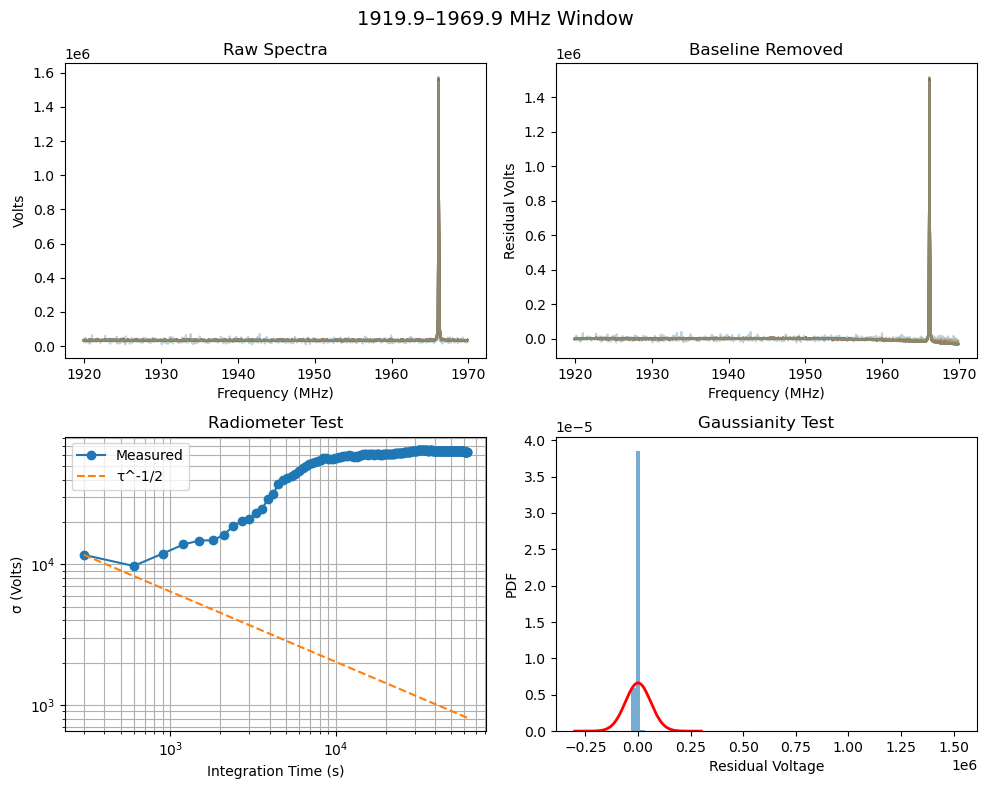

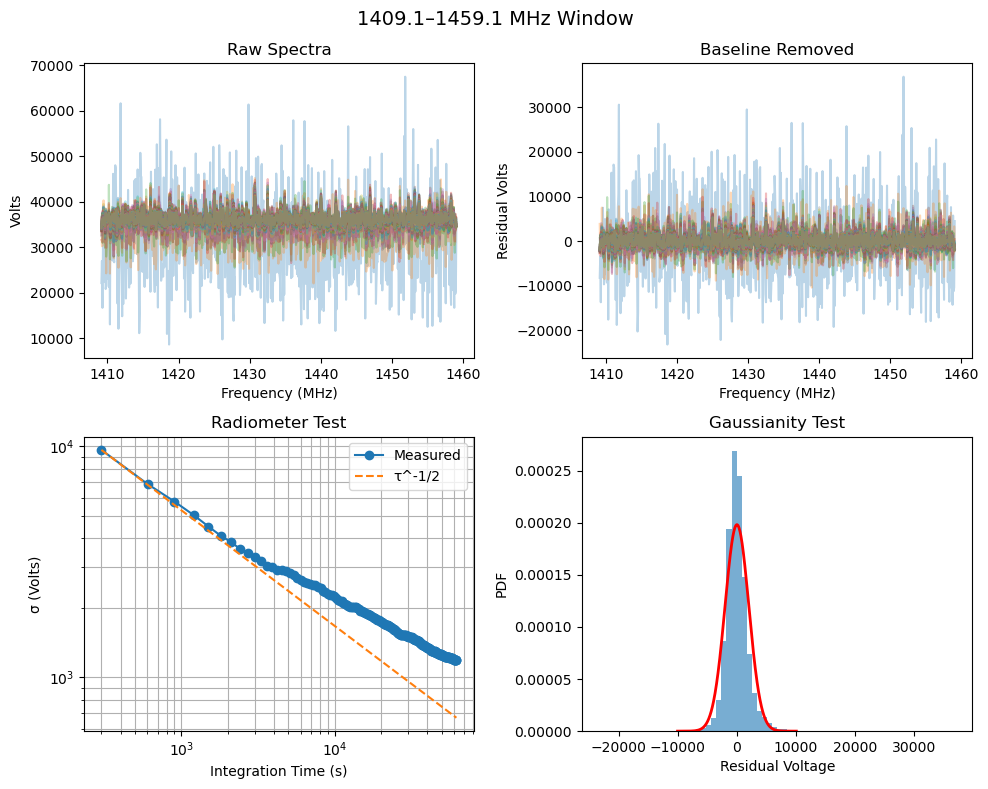

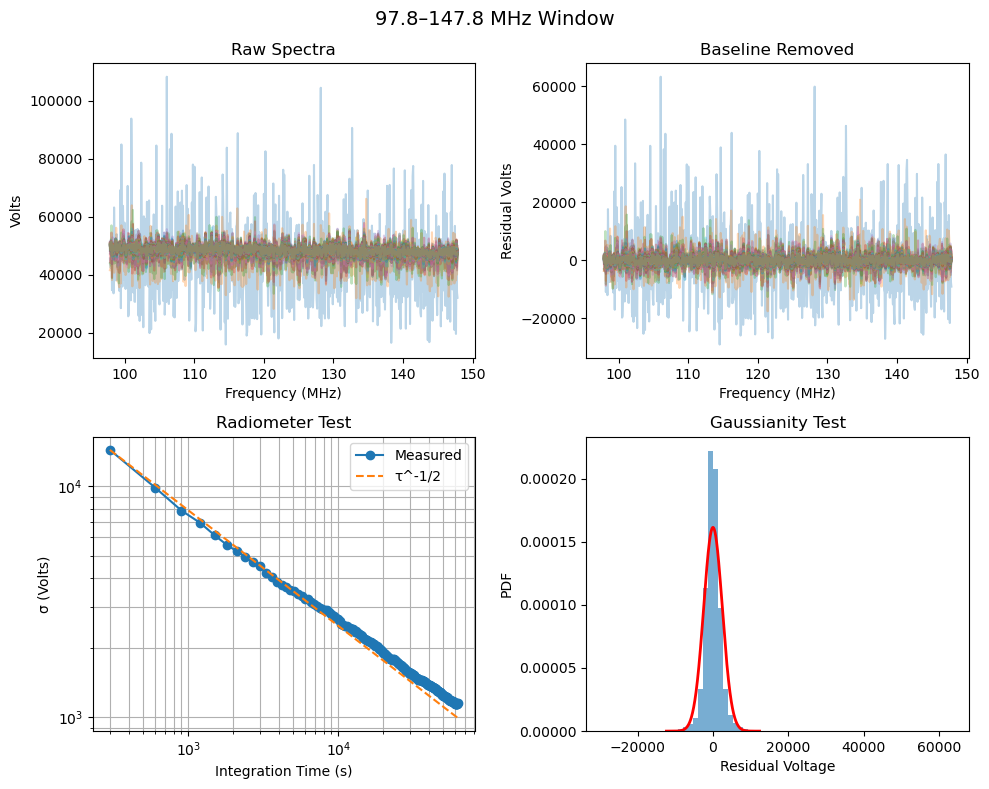

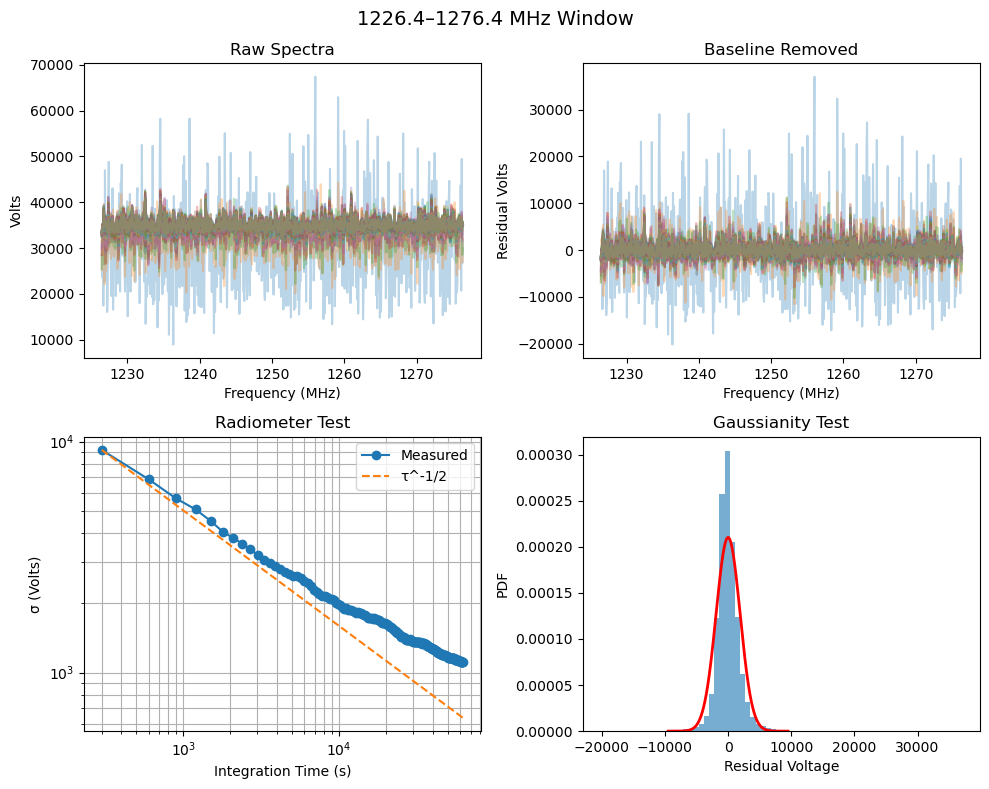

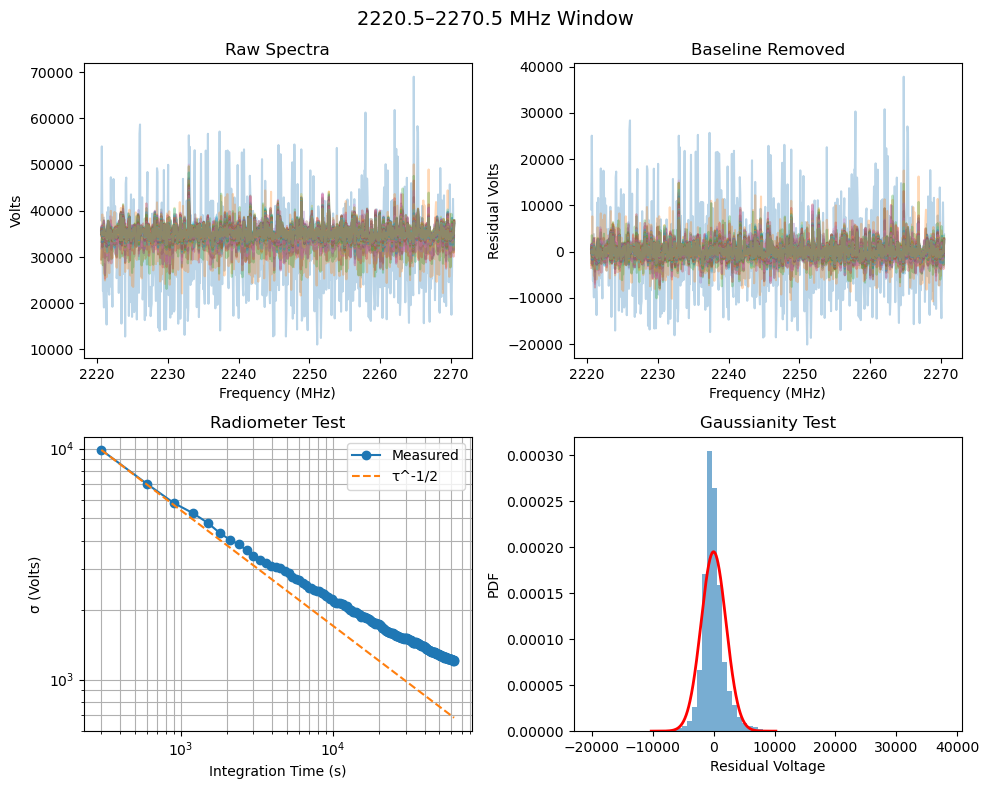

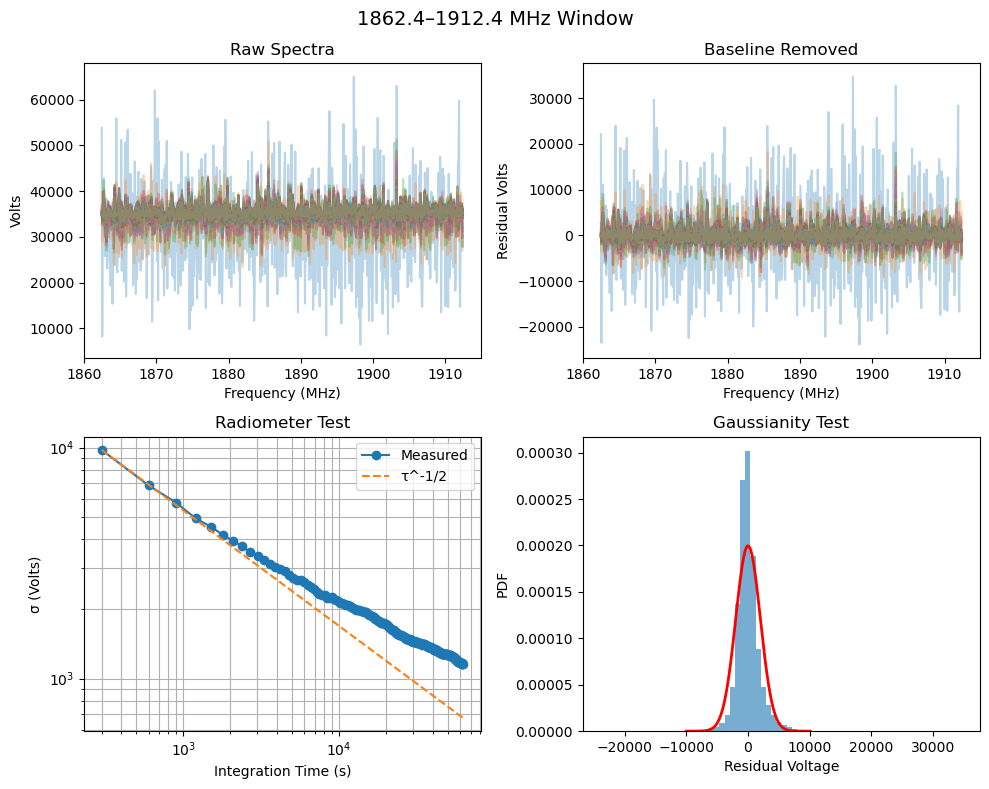

In [7]:
def load_dataset_cumulative(base_dir="."):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    # ---- sort files by elapsed time ----
    rec = []
    for f in files:
        d = np.load(f)
        rec.append((float(d["elapsed"]), f))
    rec.sort(key=lambda x: x[0])

    times = []
    inst_list = []
    F = None

    # ---- load instantaneous spectra ----
    for t, f in rec:
        d = np.load(f)

        if F is None:
            F = d["F"]

        nchan = F.size
        inst = d["inst_raw"].reshape(-1, nchan)

        volts = adu_to_volts(inst[0])  # convert BEFORE averaging

        inst_list.append(volts)
        times.append(t)

    inst_array = np.array(inst_list)
    times = np.array(times)

    # ---- build true cumulative average ----
    cumulative = np.zeros_like(inst_array)
    running_sum = np.zeros_like(inst_array[0])

    for i in range(len(inst_array)):
        running_sum += inst_array[i]
        cumulative[i] = running_sum / (i + 1)

    return F, times, cumulative, inst_array

F, times, spectra, inst = load_dataset_cumulative(".")
analyze(F, times, spectra)



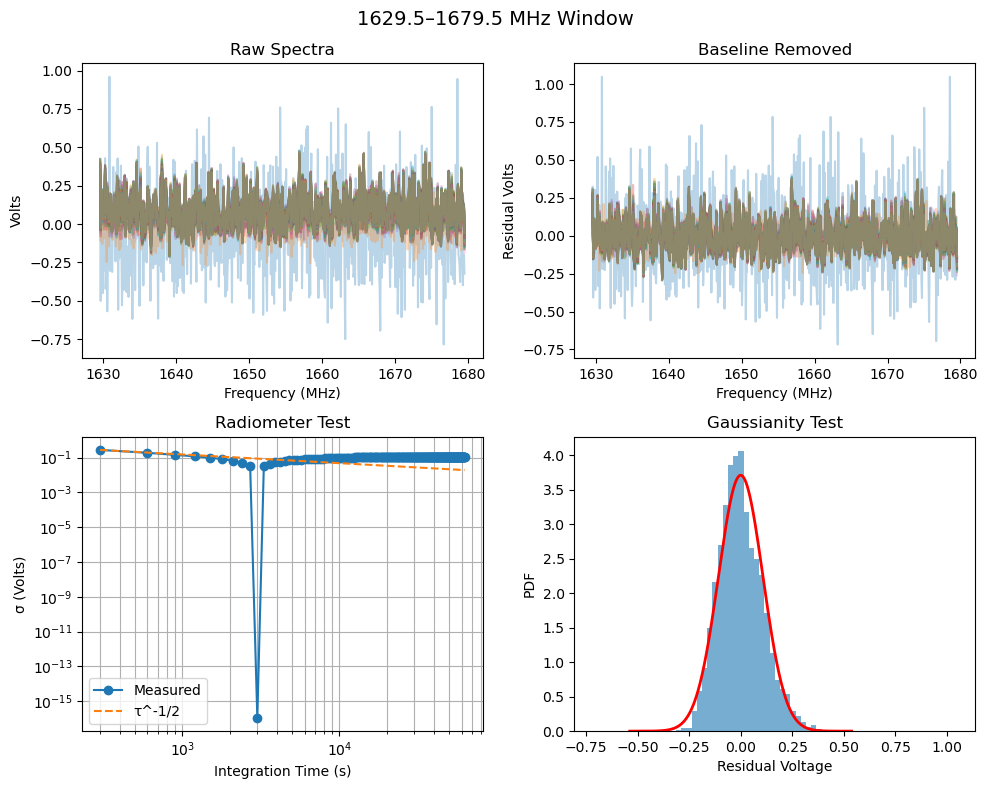

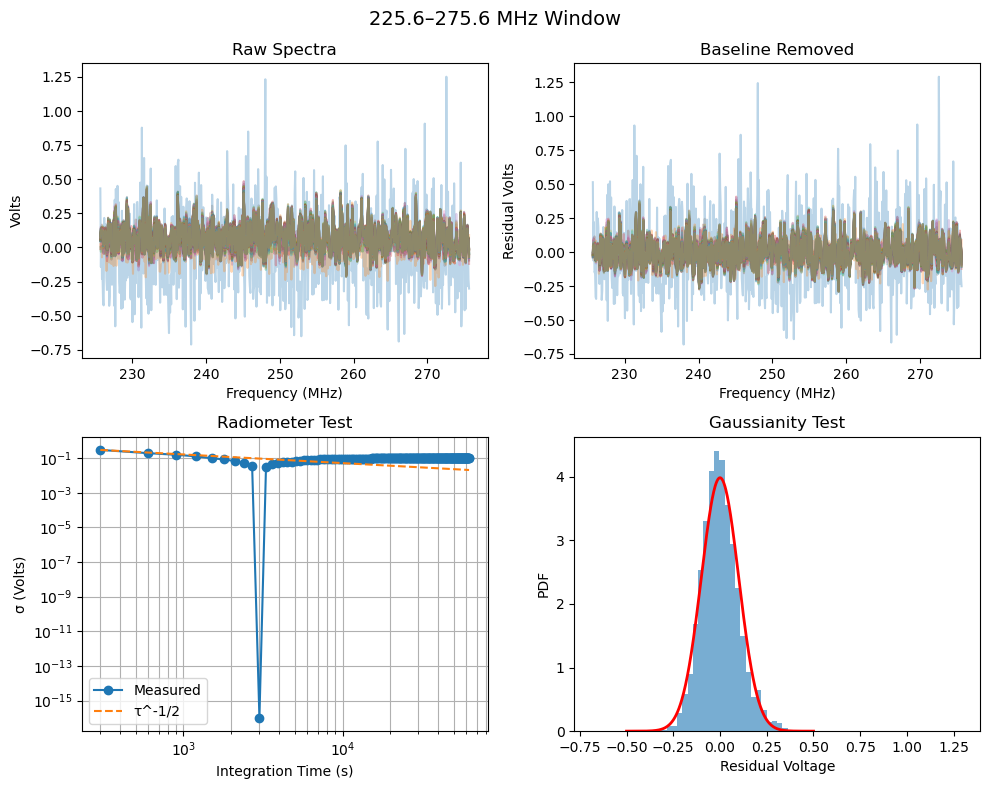

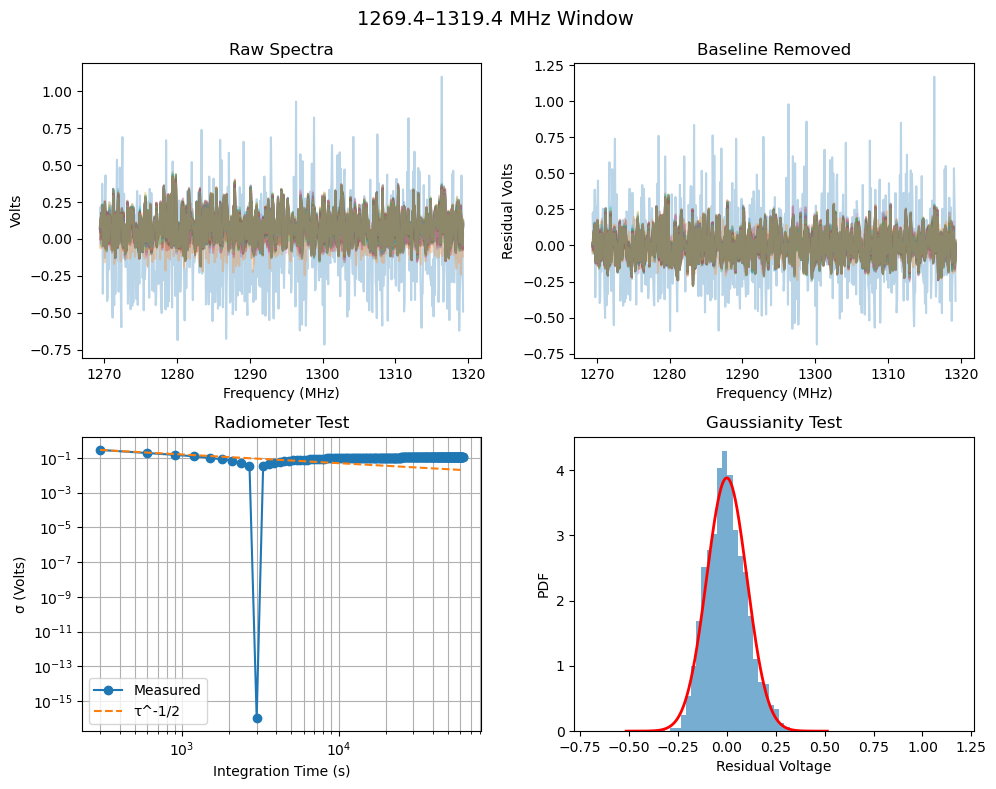

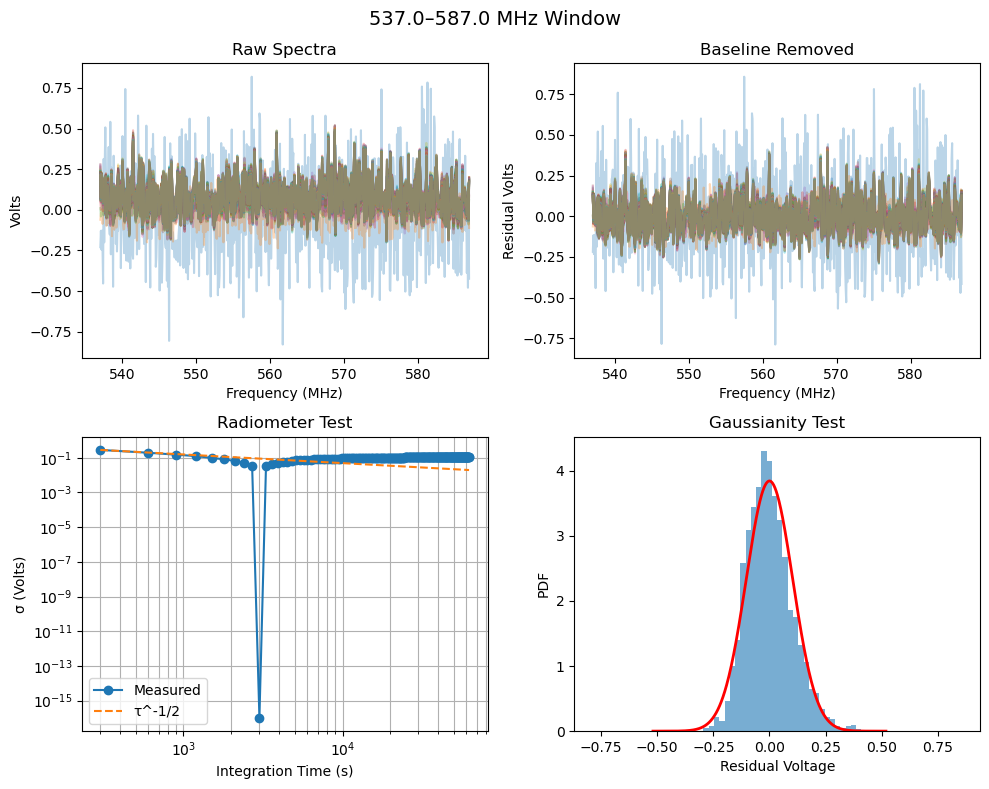

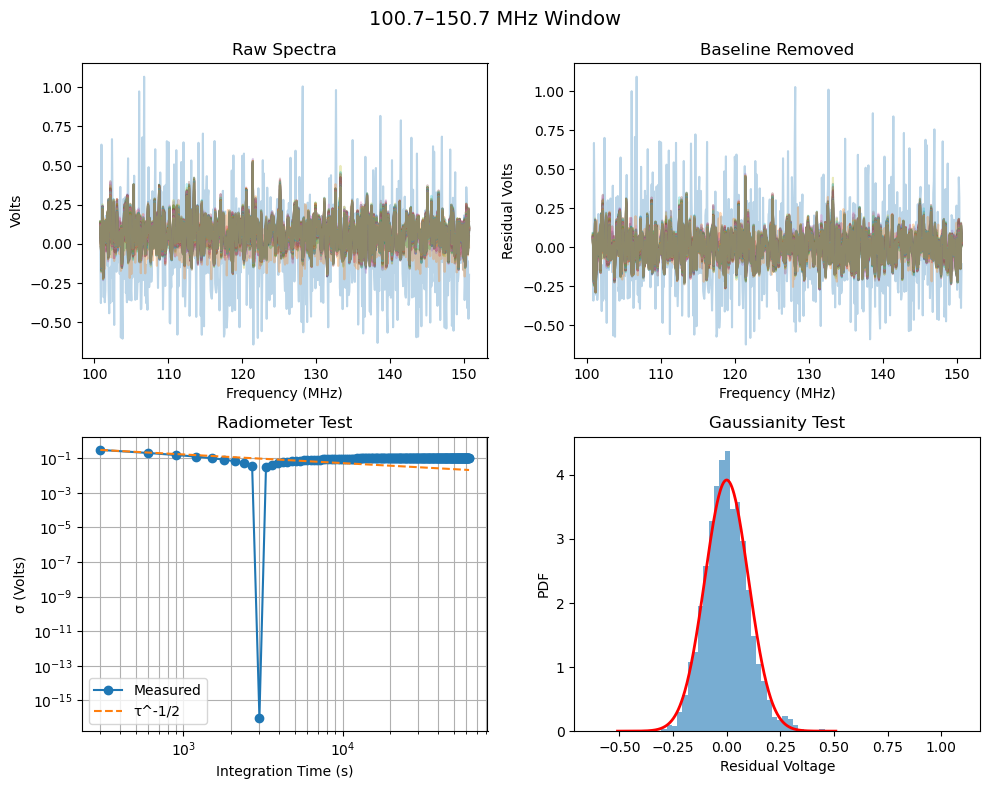

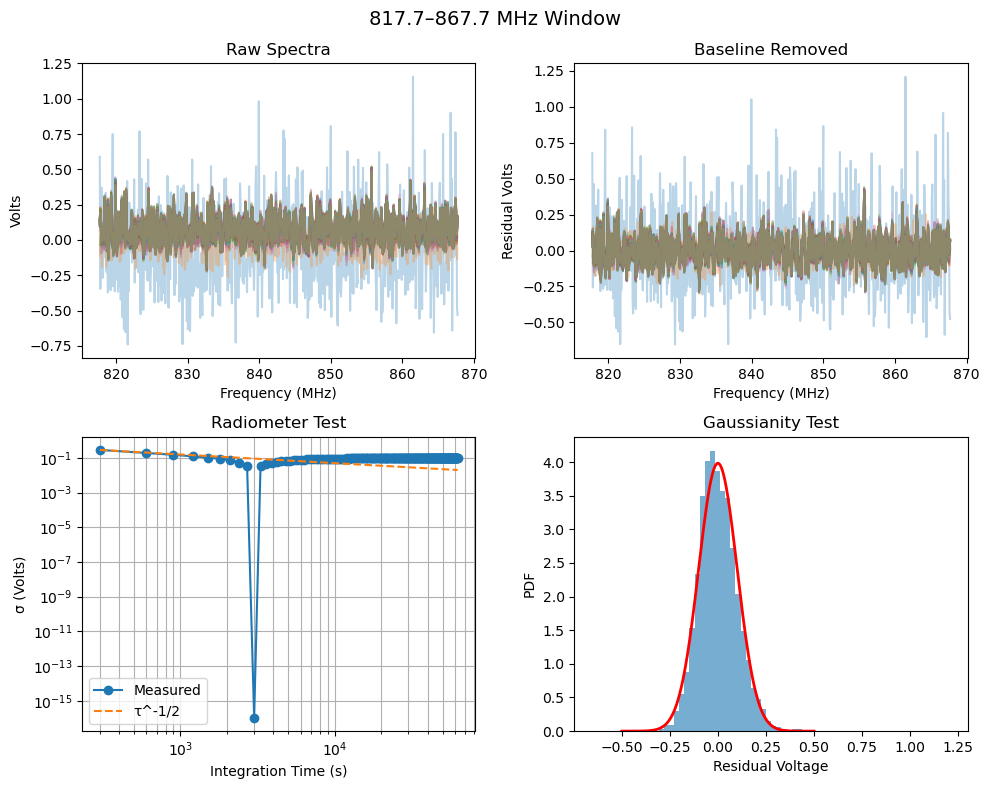

In [10]:
import glob
import numpy as np

def load_dataset_cumulative(base_dir=".", nbaseline=10, eps=1e-12):
    files = glob.glob(f"{base_dir}/*.npz")
    if not files:
        raise RuntimeError("No .npz files found")

    # ---- sort files by elapsed time ----
    rec = []
    for f in files:
        with np.load(f) as d:
            rec.append((float(d["elapsed"]), f))
    rec.sort(key=lambda x: x[0])

    times = []
    inst_list = []
    F = None

    # ---- load instantaneous spectra (already converted to volts) ----
    for t, f in rec:
        with np.load(f) as d:
            if F is None:
                F = d["F"]

            nchan = F.size
            inst = d["inst_raw"].reshape(-1, nchan)

            volts = adu_to_volts(inst[0])  # convert BEFORE any averaging
            inst_list.append(volts)
            times.append(t)

    inst_array = np.array(inst_list)   # shape = (ntime, nchan)
    times = np.array(times)

    if inst_array.shape[0] < nbaseline:
        raise RuntimeError("Not enough spectra to build baseline")

    # ---- build baseline from first N spectra ----
    baseline = np.mean(inst_array[:nbaseline], axis=0)

    # avoid divide-by-zero channels
    baseline_safe = np.where(np.abs(baseline) < eps, eps, baseline)

    # ---- subtract AND divide baseline ----
    # fractional change relative to baseline
    norm_array = (inst_array - baseline_safe) / baseline_safe

    # ---- cumulative average of normalized spectra ----
    cumulative = np.zeros_like(norm_array)
    running_sum = np.zeros_like(norm_array[0])

    for i in range(len(norm_array)):
        running_sum += norm_array[i]
        cumulative[i] = running_sum / (i + 1)

    return F, times, cumulative, norm_array, baseline

    
F, times, spectra, inst_norm, baseline = load_dataset_cumulative(".")
analyze(F, times, spectra)

In [3]:
import glob, numpy as np

files = glob.glob("*.npz")
print("Found files:", len(files))

d = np.load(files[0])
print("Keys inside file:")
print(list(d.keys()))


Found files: 208
Keys inside file:
['F', 'inst_raw', 'avg_raw', 'count', 'elapsed']
